In [1]:
import gym
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

## Seminar: Monte-carlo tree search

In this seminar, we'll implement a vanilla MCTS planning and use it to solve some Gym envs.

But before we do that, we first need to modify gym env to allow saving and loading game states to facilitate backtracking.

In [2]:
from gym.core import Wrapper
from pickle import dumps,loads
from collections import namedtuple

#a container for get_result function below. Works just like tuple, but prettier
ActionResult = namedtuple("action_result",("snapshot","observation","reward","is_done","info"))


class WithSnapshots(Wrapper):
    """
    Creates a wrapper that supports saving and loading environemnt states.
    Required for planning algorithms.

    This class will have access to the core environment as self.env, e.g.:
    - self.env.reset()           #reset original env
    - self.env.ale.cloneState()  #make snapshot for atari. load with .restoreState()
    - ...

    You can also use reset, step and render directly for convenience.
    - s, r, done, _ = self.step(action)   #step, same as self.env.step(action)
    - self.render(close=True)             #close window, same as self.env.render(close=True)
    """

        
    def get_snapshot(self):
        """
        :returns: environment state that can be loaded with load_snapshot 
        Snapshots guarantee same env behaviour each time they are loaded.
        
        Warning! Snapshots can be arbitrary things (strings, integers, json, tuples)
        Don't count on them being pickle strings when implementing MCTS.
        
        Developer Note: Make sure the object you return will not be affected by 
        anything that happens to the environment after it's saved.
        You shouldn't, for example, return self.env. 
        In case of doubt, use pickle.dumps or deepcopy.
        
        """
        #self.render() #close popup windows since we can't pickle them
        self.close()
        if self.unwrapped.viewer is not None:
            self.unwrapped.viewer.close()
            self.unwrapped.viewer = None
        return dumps(self.env)
    
    def load_snapshot(self,snapshot):
        """
        Loads snapshot as current env state.
        Should not change snapshot inplace (in case of doubt, deepcopy).
        """
        
        assert not hasattr(self,"_monitor") or hasattr(self.env,"_monitor"), "can't backtrack while recording"

        #self.render() #close=True) #close popup windows since we can't load into them
        self.close()
        self.env = loads(snapshot)
    
    def get_result(self,snapshot,action):
        """
        A convenience function that 
        - loads snapshot, 
        - commits action via self.step,
        - and takes snapshot again :)
        
        :returns: next snapshot, next_observation, reward, is_done, info
        
        Basically it returns next snapshot and everything that env.step would have returned.
        """
        self.load_snapshot(snapshot)
        next_obs, reward, done, info = self.env.step(action)
        next_snapshot = self.get_snapshot()
        #<your code here load,commit,take snapshot>
        
        return ActionResult(next_snapshot,    #fill in the variables
                            next_obs, 
                            reward, done, info )


### try out snapshots:


In [3]:
import os
if type(os.environ.get("DISPLAY")) is not str or len(os.environ.get("DISPLAY"))==0 :
    !bash ../xvfb start
    %env DISPLAY=:1

Starting virtual X frame buffer: Xvfb.
env: DISPLAY=:1


In [11]:
#make env
env = WithSnapshots(gym.make("CartPole-v0"))
env.reset()

n_actions = env.action_space.n

WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.


initial_state:


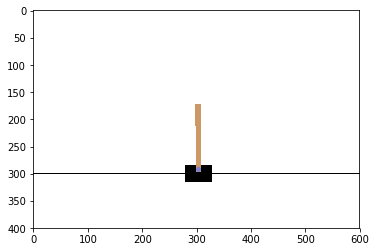

In [12]:
print("initial_state:")

plt.imshow(env.render('rgb_array'))

#create first snapshot
snap0 = env.get_snapshot()

Whoops! We died!
final state:


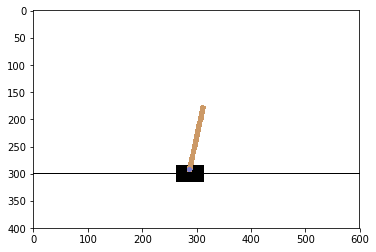

In [13]:
#play without making snapshots (faster)
while True:
    is_done = env.step(env.action_space.sample())[2]
    if is_done: 
        print("Whoops! We died!")
        break
        
print("final state:")
plt.imshow(env.render('rgb_array'))
plt.show()




After loading snapshot


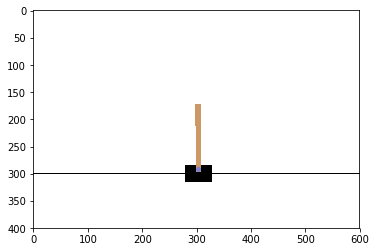

In [14]:
#reload initial state
env.load_snapshot(snap0)

print("\n\nAfter loading snapshot")
plt.imshow(env.render('rgb_array'))
plt.show()

In [8]:
#get outcome (snapshot, observation, reward, is_done, info)
res = env.get_result(snap0,env.action_space.sample())

snap1, observation, reward = res[:3]

#second step
res2 = env.get_result(snap1,env.action_space.sample())

In [8]:
env.close()

# MCTS: Monte-Carlo tree search

In this section, we'll implement the vanilla MCTS algorithm with UCB1-based node selection.

We will start by implementing the `Node` class - a simple class that acts like MCTS node and supports some of the MCTS algorithm steps.

This MCTS implementation makes some assumptions about the environment, you can find those _in the notes section at the end of the notebook_.

In [15]:
assert isinstance(env,WithSnapshots)

In [16]:
class Node:
    """ a tree node for MCTS """
    
    #metadata:
    parent = None          #parent Node
    value_sum = 0.         #sum of state values from all visits (numerator)
    times_visited = 0      #counter of visits (denominator)

    
    def __init__(self,parent,action,):
        """
        Creates and empty node with no children.
        Does so by commiting an action and recording outcome.
        
        :param parent: parent Node
        :param action: action to commit from parent Node
        
        """
        
        self.parent = parent
        self.action = action        
        self.children = set()       #set of child nodes

        #get action outcome and save it
        res = env.get_result(parent.snapshot,action)
        self.snapshot,self.observation,self.immediate_reward,self.is_done,_ = res
        
        
    def is_leaf(self):
        return len(self.children)==0
    
    def is_root(self):
        return self.parent is None
    
    def get_mean_value(self):
        return self.value_sum / self.times_visited if self.times_visited !=0 else 0
    
    def ucb_score(self,scale=10,max_value=1e100):
        """
        Computes ucb1 upper bound using current value and visit counts for node and it's parent.
        
        :param scale: Multiplies upper bound by that. From hoeffding inequality, assumes reward range to be [0,scale].
        :param max_value: a value that represents infinity (for unvisited nodes)
        
        """
        
        if self.times_visited == 0:
            return max_value
        
        #compute ucb-1 additive component (to be added to mean value)
        #hint: you can use self.parent.times_visited for N times node was considered,
        # and self.times_visited for n times it was visited
        
        U = np.sqrt(np.log(self.parent.times_visited) / self.times_visited )
        
        return self.get_mean_value() + scale*U
    
    
    #MCTS steps
    
    def select_best_leaf(self):
        """
        Picks the leaf with highest priority to expand
        Does so by recursively picking nodes with best UCB-1 score until it reaches the leaf.
        
        """
        print(self, "start select_best_leaf")
        if self.is_leaf():
            return self
        
        children = self.children
        score = 0
        for item in children:
            if item.ucb_score() > score:
                best_child = item
                score = item.ucb_score()
        print(self, "end select_best_leaf")
        return best_child.select_best_leaf()
    
    def expand(self):
        """
        Expands the current node by creating all possible child nodes.
        Then returns one of those children.
        """
        print(self, " start expand ", self.children)
        assert not self.is_done, "can't expand from terminal state"
        assert len(self.children) < 2 , "tooooo many children " + str(len(self.children))
        for action in range(n_actions):
            node = Node(self,action)
            print(node)
            self.children.add(node)
            
        print(self, "end expand")
        return self.select_best_leaf()
    
    def rollout(self,t_max=10**4):
        """
        Play the game from this state to the end (done) or for t_max steps.
        
        On each step, pick action at random (hint: env.action_space.sample()).
        
        Compute sum of rewards from current state till 
        Note 1: use env.action_space.sample() for random action
        Note 2: if node is terminal (self.is_done is True), just return 0
        
        """
        print(self, "start rollout")
        #set env into the appropriate state
        env.load_snapshot(self.snapshot)
        obs = self.observation
        is_done = self.is_done
        snapshot = self.snapshot
        #<your code here - rollout and compute reward>
        
        rollout_reward = 0
        for i in range(t_max):
            if is_done: 
                print("end rollout")
                env.load_snapshot(self.snapshot)
                return rollout_reward
            
            snapshot, _, reward, is_done, _ = env.get_result(snapshot, env.action_space.sample())
            
            rollout_reward += reward
        print(self, "end rollout")
        return rollout_reward
    
    def propagate(self,child_value):
        """
        Uses child value (sum of rewards) to update parents recursively.
        """
        print(self, "start propagate")
        #compute node value
        my_value = self.immediate_reward + child_value
        
        #update value_sum and times_visited
        self.value_sum += my_value
        self.times_visited += 1
        
        #propagate upwards
        if not self.is_root():
            self.parent.propagate(my_value)
            
        print(self, "end propagate")
    def safe_delete(self):
        """safe delete to prevent memory leak in some python versions"""
        del self.parent
        for child in self.children:
            child.safe_delete()
            del child

In [17]:
class Root(Node):
    def __init__(self,snapshot,observation):
        """
        creates special node that acts like tree root
        :snapshot: snapshot (from env.get_snapshot) to start planning from
        :observation: last environment observation
        """
        
        self.parent = self.action = None
        self.children = set()       #set of child nodes
        
        #root: load snapshot and observation
        self.snapshot = snapshot
        self.observation = observation
        self.immediate_reward = 0
        self.is_done=False
    
    @staticmethod
    def from_node(node):
        """initializes node as root"""
        root = Root(node.snapshot,node.observation)
        #copy data
        copied_fields = ["value_sum","times_visited","children","is_done"]
        for field in copied_fields:
            setattr(root,field,getattr(node,field))
        return root

In [18]:
def print_tree2(root, l=0):
    print("{} $={} v={}".format("."*l, root.value_sum, root.times_visited))

## Main MCTS loop

With all we implemented, MCTS boils down to a trivial piece of code.

In [19]:
def plan_mcts(root,n_iters=10):
    """
    builds tree with monte-carlo tree search for n_iters iterations
    :param root: tree node to plan from
    :param n_iters: how many select-expand-simulate-propagete loops to make
    """
    for i in range(n_iters):
        print("====",i,"=====",root)
        if root.is_leaf():
            node = root.expand()
        else:
            node = root.select_best_leaf() 
        
        if node.times_visited == 0:
            best_children_value = node.rollout()
            node.propagate(best_children_value)
            continue
            
        print("----",node)
        
        if not node.is_done:
            best_node = node.expand()
            best_children_value = best_node.rollout()
            node.propagate(best_children_value)
            print("exp", node)
        else:
            print("done!")

In [20]:
def plan_mcts_inside(root,n_iters=10):
    root.expand()
    for i in range(n_actions):
        node = root.select_best_leaf()
        best_children_value = node.rollout()
        node.propagate(best_children_value)
        print(node, node.value_sum)

## Plan and execute
In this section, we use the MCTS implementation to find optimal policy.

In [21]:
root_observation = env.reset()
root_snapshot = env.get_snapshot()
root = Root(root_snapshot,root_observation)

In [23]:
snapshot = root_snapshot

for i in range(1000):
    snapshot, _, reward, is_done, _ = env.get_result(snapshot, env.action_space.sample())
    #print(reward, is_done)
    if is_done:
        env.reset()
        print(i, "end rollout")
        env.load_snapshot(root_snapshot)
        snapshot = root_snapshot

16 end rollout
30 end rollout
41 end rollout
106 end rollout
169 end rollout
183 end rollout
201 end rollout
214 end rollout
261 end rollout
288 end rollout
315 end rollout
344 end rollout
371 end rollout
395 end rollout
409 end rollout
425 end rollout
435 end rollout
455 end rollout
473 end rollout
494 end rollout
525 end rollout
540 end rollout
558 end rollout
568 end rollout
581 end rollout
651 end rollout
664 end rollout
697 end rollout
723 end rollout
742 end rollout
752 end rollout
764 end rollout
790 end rollout
828 end rollout
864 end rollout
891 end rollout
922 end rollout
949 end rollout
960 end rollout
982 end rollout
994 end rollout


In [24]:
#plan from root:
plan_mcts(root,n_iters=1000)

==== 0 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90>  start expand  set()
<__main__.Root object at 0x7fcc10239a90> end expand
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start rollout
end rollout
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
==== 1 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5978> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5978> start rollout
end rollout
<__main__.Node object at 0x7fcbe94e5978>

<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
exp <__main__.Node object at 0x7fcbdda206a0>
==== 14 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_lea

<__main__.Node object at 0x7fcbdd94dfd0> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbdd94dfd0> end propagate
<__main__.Node object at 0x7fcbdd94dda0> end propagate
==== 22 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node

end rollout
<__main__.Node object at 0x7fcbdda08198> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda08198> end propagate
exp <__main__.Node object at 0x7fcbdda08198>
==== 28 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90>

<__main__.Node object at 0x7fcbdda08f28> end propagate
<__main__.Node object at 0x7fcbdda34ac8> end propagate
==== 34 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda08198> start select_best_leaf
<__main__.Node 

<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda08198> end propagate
<__main__.Node object at 0x7fcbdd94dac8> end propagate
<__main__.Node object at 0x7fcbdda2a978> end propagate
==== 39 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end se

<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda08198> end propagate
<__main__.Node object at 0x7fcbdd94dac8> end propagate
<__main__.Node object at 0x7fcbdda2a978> end propagate
<__main__.Node object at 0x7fcbe9532860> end propagate
exp <__main__.Node object at 0x7fcbe9532860>
==== 44 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_l

<__main__.Node object at 0x7fcbdd94dac8> end propagate
<__main__.Node object at 0x7fcbdda2a978> end propagate
<__main__.Node object at 0x7fcbe9532860> end propagate
<__main__.Node object at 0x7fcbe9532e10> end propagate
==== 48 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1cc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94ddd8> start select_best_leaf
---- <__main__.Node object at 0x7fcbdd94ddd8>
<__main__.Node object at 0x7fcbdd94ddd8>  start expand  set()
<__main__.Node object at 0x7fcbdd94ddd8> end expand
<__main__.Node object at 0x7fcbdd94ddd8> start select_best_leaf
<__main__.Node object at 0x7fcbdd94ddd8> end select_best_leaf
<__main__.Node object at 0x7fcbdda34a90> start select_best_leaf
<__main__.Node object at 0x7fcbdda34a90> start rollout
end rollout
<__main__.Node object at 0x7fcbdd94ddd8> start propagate
<__main__.Node object at 0x7fcbe94d1cc0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda

end rollout
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe953

<__main__.Node object at 0x7fcbe9532e80> start select_best_leaf
---- <__main__.Node object at 0x7fcbe9532e80>
<__main__.Node object at 0x7fcbe9532e80>  start expand  set()
<__main__.Node object at 0x7fcbe9532e80> end expand
<__main__.Node object at 0x7fcbe9532e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9532e80> end select_best_leaf
<__main__.Node object at 0x7fcbe9525a58> start select_best_leaf
<__main__.Node object at 0x7fcbe9525a58> start rollout
end rollout
<__main__.Node object at 0x7fcbe9532e80> start propagate
<__main__.Node object at 0x7fcbdda08668> start propagate
<__main__.Node object at 0x7fcbdd94dfd0> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.

<__main__.Node object at 0x7fcbdda34f98> start select_best_leaf
<__main__.Node object at 0x7fcbdda34f98> end select_best_leaf
<__main__.Node object at 0x7fcbe9522c50> start select_best_leaf
<__main__.Node object at 0x7fcbe9522c50> start rollout
end rollout
<__main__.Node object at 0x7fcbe9522c50> start propagate
<__main__.Node object at 0x7fcbdda34f98> start propagate
<__main__.Node object at 0x7fcbdda08f28> start propagate
<__main__.Node object at 0x7fcbe94e57b8> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbe94e57b8> end propagate
<__main__.Node object at 0x7fcbdda08f28> end propagate
<__main__.Node object at 0x7fcbdda34f98> end propagate
<__main__.Node

<__main__.Node object at 0x7fcbe9522c18> start rollout
end rollout
<__main__.Node object at 0x7fcbdd94d748> start propagate
<__main__.Node object at 0x7fcbe025cac8> start propagate
<__main__.Node object at 0x7fcbdd94dac8> start propagate
<__main__.Node object at 0x7fcbdda08198> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdd

<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
exp <__main__.Node object at 0x7fcbe9532898>
====

<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe94e57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94e57b8> end select_best_leaf
<__main__.Node object at 0x7fcbdda08f28> start select_best_leaf
<__main__.Node object at 0x7fcbdda08f28> end select_best_leaf
<__main__.Node object at 0x7fcbdda34f98> start select_best_leaf
<__main__.Node object at 0x7fcbdda34f98> end select_best_leaf
<__main__.Node object at 0x7fcbe9522c50> start select_best_leaf
---- <__main__.Node object at 0x7fcbe9522c50>
<__main__.Node object at 0x7fcbe9522c50>  start expand  set()
<__main__.Node object at 0x7fcbe9522c50> end expand
<__main__.Node object at 0x7fcbe9522c50> start select_best_leaf
<__main__.Node objec

<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbe94e59b0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e59b0> end select_best_leaf
<__main__.Node object at 0x7fcbe9532a90> start select_best_leaf
<__main__.Node object at 0x7fcbe9532a90> start rollout
end rollout
<__main__.Node object at 0x7fcbe9532a90> start propagate
<__main__.Node object at 0x7fcbe94e59b0> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object a

<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbe94e59b0> end propagate
<__main__.Node object at 0x7fcbe9532cf8> end propagate
<__main__.Node object at 0x7fcbe951ec18> end propagate
exp <__main__.Node object at 0x7fcbe951ec18>
==== 112 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_

<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532828> end propagate
<__main__.Node object at 0x7fcbdda34d68> end propagate
<__main__.Node object at 0x7fcbe951c0b8> end propagate
==== 118 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node o

<__main__.Node object at 0x7fcbdda34d68> end propagate
<__main__.Node object at 0x7fcbe951c0b8> end propagate
<__main__.Node object at 0x7fcbe951e048> end propagate
==== 122 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object a

<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_be

<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532828> start select_best_leaf
<__main__.Node object at 0x7fcbe9532828> end select_best_leaf
<__main__.Node object at 0x7fcbdda34d68> start select_best_leaf
<__main__.Node object at 0x7fcbdda34d68> end select_best_leaf
<__main__.Node object at 0x7fcbe951c0b8> start select_best_leaf
<__main__.Node object at 0x7fcbe951c0b8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cb00> start select_be

<__main__.Node object at 0x7fcbe94e5908> start rollout
end rollout
<__main__.Node object at 0x7fcbe94e5908> start propagate
<__main__.Node object at 0x7fcbe951e860> start propagate
<__main__.Node object at 0x7fcbe9532cf8> start propagate
<__main__.Node object at 0x7fcbe94e59b0> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe951e748> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> en

<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951c940> end propagate
<__main__.Node object at 0x7fcbe951c2e8> end propagate
==== 149 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe

<__main__.Node object at 0x7fcbe951c390> start propagate
<__main__.Node object at 0x7fcbe951c940> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88

<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe951e7b8> end propagate
exp <__main__.Node object at 0x7fcbe951e7b8>
==== 156 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node ob

end rollout
<__main__.Node object at 0x7fcbe951ca90> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x

<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951ca90> start select_best_leaf
<__main__.Node object at 0x7fcbe951ca90> end select_best_leaf
<__main__.Node object at 0x7fcbe951cd68> start select_best_leaf
<__main__.Node object at 0x7fcbe951cd68> start rollout
end rollout
<__main__.Node object at 0x7fcbe951cd68> start propagate
<__main__.Node object at 0x7fcbe951ca90> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propaga

<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951ca90> end propagate
<__main__.Node object at 0x7fcbe951c4a8> end propagate
<__main__.Node object at 0x7fcbe951cfd0> end propagate
==== 169 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end s

<__main__.Node object at 0x7fcbe951c3c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515080> start select_best_leaf
<__main__.Node object at 0x7fcbe9515080> start rollout
end rollout
<__main__.Node object at 0x7fcbe951c3c8> start propagate
<__main__.Node object at 0x7fcbe951c4a8> start propagate
<__main__.Node object at 0x7fcbe951ca90> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__

<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe951e7b8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e7b8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cef0> start select_best_leaf
<__main__.Node object at 0x7fcbe951cef0> start rollout
end rollout
<__main__.Node object at 0x7fcbe951cef0> start prop

<__main__.Node object at 0x7fcbe9515d68> end select_best_leaf
<__main__.Node object at 0x7fcbe95154e0> start select_best_leaf
<__main__.Node object at 0x7fcbe95154e0> start rollout
end rollout
<__main__.Node object at 0x7fcbe9515d68> start propagate
<__main__.Node object at 0x7fcbe951c208> start propagate
<__main__.Node object at 0x7fcbe951e7b8> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Nod

<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_be

exp <__main__.Node object at 0x7fcbe951ce80>
==== 193 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node ob

<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
==== 197 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object a

<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe9

<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
==== 204 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object a

<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
==== 207 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node

<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
exp <__main__.Node object at 0x7fcbe95153c8>
==== 211 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0>

<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.

<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_be

<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515518> start select_best_leaf
<__main__.Node object at 0x7fcbe9515518> end select_best_leaf
<__main__.Node object at 0x7fcbe95152e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95152e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515128> start select_best_leaf
<__main__.Node object at 0x7fcbe9515128> start rollout
end rollout
<__main__.Node object at 0x7fcbe9515128> start propagate
<__main__.Node object at 0x7fcbe95152e8> start propagate
<__main__.Node object at 0x7fcbe9515518> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe951

<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_be

<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515518> end propagate
<__main__.Node object at 0x7fcbe9515668> end propagate
<__main__.Node object at 0x7fcbe9515320> end propagate
<__main__.Node object at 0x7fcbe9517198> end propagate
==== 229 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_b

<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> en

<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_be

<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515da0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515da0> end select_best_leaf
<__main__.Node object at 0x7fcbe9517320> start select_best_leaf
<__main__.Node object at 0x7fcbe9517320> end select_best_leaf
<__main__.Node object at 0x7fcbe9517240> start select_best_leaf
<__main__.Node object at 0x7fcbe9517240> start rollout
end rollout
<__main__.Node object at 0x7fcbe9517240> start propagate
<__main__.Node object at 0x7fcbe9517320> start propagate
<__main__.Node object at 0x7fcbe9515da0> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.N

<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end pr

<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propag

<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515438> start select_best_leaf
<__main__.Node object at 0x7fcbe9515438> end select_best_leaf
<__main__.Node object at 0x7fcbdd99c240> start select_best_leaf
<__main__.Node object at 0x7fcbdd99c240> start rollout
end rollout
<__main__.Node object at 0x7fcbdd99c240> start propagate
<__main__.Node object at 0x7fcbe9515438> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object a

<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe95120b8> end propagate
exp <__main__.Node object at 0x7fcbe95120b8>
==== 258 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0

<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> en

<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515518> start select_best_leaf
<__main__.Node object at 0x7fcbe9515518> end select_best_leaf
<__main__.Node object at 0x7fcbe95152e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95152e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9512ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9512ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe02efd30> start select_best_leaf
<__main__.Node object at 0x7fcbe02efd30> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef7b8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef7b8> start rollout
end rollout
<__main__.Node object at 0x7fcbe02ef7b8> start propagate
<__main__.Node object at 0x7fcbe02efd30> start propagate

<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc

<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515518> end propagate
<__main__.Node object at 0x7fcbe95152e8> end propagate
<__main__.Node object at 0x7fcbe9512ef0> end propagate
<__main__.Node object at 0x7fcbe02efd30> end propagate
<__main__.Node object at 0x7fcbe02ef7b8> end propagate
<__main__.Node object at 0x7fcbe951c550> end propagate
<__main__.Node object at 0x7fcbe02eff98> end propagate
==== 273 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe

<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e

<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagat

<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88

<__main__.Node object at 0x7fcbe02efe80> start select_best_leaf
<__main__.Node object at 0x7fcbe02efe80> start rollout
end rollout
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node

<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef828> end propagate
<__main__.Node object at 0x7fcbe02ef320> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515198> end propagate
exp <__mai

<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagat

<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__m

<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02efda0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efda0> start rollout
end rollout
<__main__.Node object at 0x7fcbe02efda0> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe951

<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206

<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcb

==== 313 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_lea

<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_be

<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_be

<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02ef470> end propagate
exp <__main__.Node object at 0x7fcbe02ef470>
==== 322 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root obje

<__main__.Node object at 0x7fcbe02ef470> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef470> end select_best_leaf
<__main__.Node object at 0x7fcbdd943908> start select_best_leaf
---- <__main__.Node object at 0x7fcbdd943908>
<__main__.Node object at 0x7fcbdd943908>  start expand  set()
<__main__.Node object at 0x7fcbdd943908> end expand
<__main__.Node object at 0x7fcbdd943908> start select_best_leaf
<__main__.Node object at 0x7fcbdd943908> end select_best_leaf
<__main__.Node object at 0x7fcbdd943860> start select_best_leaf
<__main__.Node object at 0x7fcbdd943860> start rollout
end rollout
<__main__.Node object at 0x7fcbdd943908> start propagate
<__main__.Node object at 0x7fcbe02ef470> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start prop

<__main__.Node object at 0x7fcbe02ef470> end propagate
<__main__.Node object at 0x7fcbdd943908> end propagate
<__main__.Node object at 0x7fcbdd9430f0> end propagate
==== 327 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object a

<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_be

<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end prop

<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_be

<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc

<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbdd943780> end propagate
<__main__.Node object at 0x7fcbdd943390> end propagate
<__main__.Node object at 0x7fcbdd9439e8> end propagate
<__main__.Node object at 0x7fcbdd943978> end propagate
==== 344 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object a

<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main_

<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_be

<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc

<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e

<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbdd943780> start select_best_leaf
<__main__.Node object at 0x7fcbdd943780> end select_best_leaf
<__main__.Node object at 0x7fcbdd943390> start select_best_leaf
<__main__.Node object at 0x7fcbdd943390> end select_best_leaf
<__main__.Node object at 0x7fcbdd943fd0> start select_best_leaf
---- <__main__.Node object at 0x7fcbdd943fd0>
<__main__.Node object at 0x7fcbdd943fd0>  start expand  set()
<__main__.Node object at 0x7fcbdd943fd0> end expand
<__main__.Node objec

<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_be

<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc

<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate


<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_be

<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef470> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef470> end select_best_leaf
<__main__.Node object at 0x7fcbdd943908> start select_best_leaf
<__main__.Node object at 0x7fcbdd943908> end select_best_leaf
<__main__.Node object at 0x7fcbdd943860> start select_best_leaf
<__main__.Node object at 0x7fcbdd943860> end select_best_leaf
<__main__.Node object at 0x7fcbdd943d30> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d30> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef3c8> start select_be

<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_be

<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<_

<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbdd943780> start select_best_leaf
<__main__.Node object at 0x7fcbdd943780> end select_best_leaf
<__main__.Node object at 0x7fcbdd943390> start select_best_leaf
<__main__.Node object at 0x7fcbdd943390> end select_best_leaf
<__main__.Node object at 0x7fcbdd9439e8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9439e8> end select_best_leaf
<__main__.Node object at 0x7fcbdd9437f0> start select_best_leaf
<__main__.Node object at 0x7fcbdd9437f0> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e128> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e128> start rollout
end rollout
<__main__.Node object at 0x7fcbdd93e128> start propagate
<__main__.Node object at 0x7fcbdd9437f0> start propagate
<__main__.Node object at 0x7fcbdd9439e8> start propagate
<__main__.Node object at 0x7fcbdd943390> start propagate
<__main__.Node object at 0x7fcbdd943780> start propagate
<__main__.Node obj

<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbdd943780> end propagate
<__main__.Node object at 0x7fcbdd943390> end propagate
<__main__.Node object at 0x7fcbdd9439e8> end propagate
<__main__.

<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propag

<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_be

<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propag

<__main__.Node object at 0x7fcbdd943780> end propagate
<__main__.Node object at 0x7fcbdd943390> end propagate
<__main__.Node object at 0x7fcbdd9439e8> end propagate
<__main__.Node object at 0x7fcbdd943978> end propagate
<__main__.Node object at 0x7fcbdd93ebe0> end propagate
<__main__.Node object at 0x7fcbdd93ef60> end propagate
==== 400 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end s

<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef470> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef470> end select_best_leaf
<__main__.Node object at 0x7fcbdd943908> start select_best_leaf
<__main__.Node object at 0x7fcbdd943908> end select_best_leaf
<__main__.Node object at 0x7fcbdd9430f0> start select_best_leaf
<__main__.Node object at 0x7fcbdd9430f0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943cc0> start select_best_leaf
---- <__main__.Node object at 0x7fcbdd943cc0>
<__main__.Node object at 0x7fcbdd943cc0>  start expand  set()
<__main__.Node object at 0x7fcbdd943cc0> end expand
<__main__.Node objec

<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.

<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbdd943780> end propagate
<__main__.Node object at 0x7fcbdd943390> end propagate
<__main__.Node object at 0x7fcbdd943fd0> end propagate
<__main__.Node object at 0x7fcbdd943c18> end propagate
<__main__.Node object at 0x7fcbe023e400> end propagate
==== 410 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf


<__main__.Node object at 0x7fcbdd943390> end propagate
<__main__.Node object at 0x7fcbdd943fd0> end propagate
<__main__.Node object at 0x7fcbdd943c18> end propagate
<__main__.Node object at 0x7fcbe023e400> end propagate
exp <__main__.Node object at 0x7fcbe023e400>
==== 412 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start se

<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_be

<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_be

<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate


<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_be

<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> 

<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_be

<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.

<__main__.Node object at 0x7fcbe953a978> end propagate
==== 432 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main

<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_be

<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end pr

<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbdd943780> start select_best_leaf
<__main__.Node object at 0x7fcbdd943780> end select_best_leaf
<__main__.Node object at 0x7fcbdd943f28> start select_best_leaf
<__main__.Node object at 0x7fcbdd943f28> end select_best_leaf
<__main__.Node object at 0x7fcbdd943f60> start select_best_leaf
<__main__.Node object at 0x7fcbdd943f60> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ef0> start select_best_leaf
---- <__main__.Node object at 0x7fcbdd943ef0>
<__main__.Node object at 0x7fcbdd943ef0>  start expand  set()
<__main__.Node object at 0x7fcbdd943ef0> end expand
<__main__.Node object at 0x7fcbdd943ef0> start select_best_leaf
<__main__.Node objec

end rollout
<__main__.Node object at 0x7fcbe953aac8> start propagate
<__main__.Node object at 0x7fcbea241cf8> start propagate
<__main__.Node object at 0x7fcbe023e048> start propagate
<__main__.Node object at 0x7fcbdd93ecf8> start propagate
<__main__.Node object at 0x7fcbdd943c18> start propagate
<__main__.Node object at 0x7fcbdd943fd0> start propagate
<__main__.Node object at 0x7fcbdd943390> start propagate
<__main__.Node object at 0x7fcbdd943780> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node obje

<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbdd943780> end propagate
<__main__.Node object at 0x7fcbdd943390> end propagate
<__main__.Node object at 0x7fcbdd943fd0> end propagate
<__main__.Node object at 0x7fcbdd943c18> end propagate
<__main__.Node object at 0x7fcbdd93ecf8> end propagate
<__main__.Node object at 0x7fcbe023e048> end propagate
<__main__.Node object at 0x7fcbea241cf8> end propagate
<__main__.Node object at 0x7fcbe953aac8> end propagate
<__main__.Node object at 0x7fcbe953a668> end propagate
==== 444 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_bes

<__main__.Node object at 0x7fcbdd943390> end select_best_leaf
<__main__.Node object at 0x7fcbdd943fd0> start select_best_leaf
<__main__.Node object at 0x7fcbdd943fd0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943c18> start select_best_leaf
<__main__.Node object at 0x7fcbdd943c18> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ecf8> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ecf8> end select_best_leaf
<__main__.Node object at 0x7fcbe023eba8> start select_best_leaf
<__main__.Node object at 0x7fcbe023eba8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e9b0> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e9b0> end select_best_leaf
<__main__.Node object at 0x7fcbe954a7b8> start select_best_leaf
<__main__.Node object at 0x7fcbe954a7b8> start rollout
end rollout
<__main__.Node object at 0x7fcbe954a7b8> start propagate
<__main__.Node object at 0x7fcbdd93e9b0> start propagate
<__main__.Node object at 0x7fcbe023eba8> start propagate
<__mai

<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943b70> end propagate
<__main__.Node object at 0x7fcbdd943630> end propagate
exp <__main__.Node object at 0x7fcbdd943630>
==== 450 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best

<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_be

<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_be

<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe953a9b0> start propagate
<__main__.Node object at 0x7fcbdd93eda0> start propagate
<__main__.Node object at 0x7fcbe02ef2b0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbdd943780> start select_best_leaf
<__main__.Node object at 0x7fcbdd943780> end select_best_leaf
<__main__.Node object at 0x7fcbdd943390> start select_best_leaf
<__main__.Node object at 0x7fcbdd943390> end select_best_leaf
<__main__.Node object at 0x7fcbdd943fd0> start select_best_leaf
<__main__.Node object at 0x7fcbdd943fd0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943c18> start select_best_leaf
<__main__.Node object at 0x7fcbdd943c18> end select_be

<__main__.Node object at 0x7fcbdd943978> start propagate
<__main__.Node object at 0x7fcbdd9439e8> start propagate
<__main__.Node object at 0x7fcbdd943390> start propagate
<__main__.Node object at 0x7fcbdd943780> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbdd943780> end propagate
<__main__.Node object at 0x7fcbdd943390> end propagate
<__main__.Node object at 0x7fcbdd9439e8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_be

<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02ef470> end propagate
<__main__.Node object at 0x7fcbdd943908> end propagate
<__main__.Node object at 0x7fcbdd943860> end propagate
<__main__.Node object at 0x7fcbdd943d30> end propagate
<__main__.Node object at 0x7fcbdd93e198> end propagate
exp <__main__.Node object at 0x7fcbdd93e198>
==== 482 ===== <__ma

<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_be

<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_be

<__main__.Node object at 0x7fcbdd93e128> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e128> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e8d0> start select_best_leaf
---- <__main__.Node object at 0x7fcbdd93e8d0>
<__main__.Node object at 0x7fcbdd93e8d0>  start expand  set()
<__main__.Node object at 0x7fcbdd93e8d0> end expand
<__main__.Node object at 0x7fcbdd93e8d0> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e8d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9529160> start select_best_leaf
<__main__.Node object at 0x7fcbe9529160> start rollout
end rollout
<__main__.Node object at 0x7fcbdd93e8d0> start propagate
<__main__.Node object at 0x7fcbdd93e6d8> start propagate
<__main__.Node object at 0x7fcbdd93e128> start propagate
<__main__.Node object at 0x7fcbdd9437f0> start propagate
<__main__.Node object at 0x7fcbdd9439e8

<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e

<__main__.Node object at 0x7fcbdd93ecf8> end propagate
<__main__.Node object at 0x7fcbe023e048> end propagate
<__main__.Node object at 0x7fcbe9536048> end propagate
<__main__.Node object at 0x7fcbe953a978> end propagate
<__main__.Node object at 0x7fcbe95413c8> end propagate
exp <__main__.Node object at 0x7fcbe95413c8>
==== 498 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best

<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_be

<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
exp <__main__.Node object at 0x7fcbe64a7128>
==== 503 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.

<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_be

<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> start select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> end select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_be

<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start rollout
end rollout
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.N

<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_be

<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_be

<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end 

<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_be

<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_be

<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> start select_be

<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd943a58> end propagate
<__main__.Node object at 0x7fcbe0d02208> end propagate
==== 531 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0

<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_be

<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
exp <__main__.Node object at 0x7fcbe0d2af28>
==== 534 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best

<__main__.Node object at 0x7fcbe95326d8> start select_best_leaf
<__main__.Node object at 0x7fcbe95326d8> start rollout
end rollout
<__main__.Node object at 0x7fcbe95326d8> start propagate
<__main__.Node object at 0x7fcbe953eeb8> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node

<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_be

<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe953ecc0> start select_best_leaf
<__main__.Node object at 0x7fcbe953ecc0> start rollout
end rollout
<__main__.Node object at 0x7fcbe953ecc0> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fc

<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagat

<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_be

<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.

<__main__.Node object at 0x7fcbe953ee10> start propagate
<__main__.Node object at 0x7fcbe9541908> start propagate
<__main__.Node object at 0x7fcbe9541b38> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_be

<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcb

end rollout
<__main__.Node object at 0x7fcbe9532668> start propagate
<__main__.Node object at 0x7fcbe953eef0> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node obje

<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_be

<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.

<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_be

<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_be

end rollout
<__main__.Node object at 0x7fcbe94e1390> start propagate
<__main__.Node object at 0x7fcbe94dd128> start propagate
<__main__.Node object at 0x7fcbe94d94e0> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node obje

<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_be

<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.

<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_be

<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd5f8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd5f8> start rollout
end rollout
<__main__.Node object at 0x7fcbe94dd5f8> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propaga

<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_be

<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
---- <__main__.Node object at 0x7fcbe9525be0>
<__main__.Node object at 0x7fcbe9525be0>  start expand  set()
<__main__.Node object at 0x7fcbe9525be0> end expand
<__main__.Node objec

<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc

<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_be

<__main__.Node object at 0x7fcbdd943d68> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_be

<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d94e0> end propagate
<__main__.Node object at 0x7fcbe94dd128> end propagate
<__main__.Node object at 0x7fcbe94dd3c8> end propagate
<__main__.Node object at 0x7fcc180747f0> end propagate
exp <__main__.Node object at 0x7fcc180747f0>
==== 584 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root obje

<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> start select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> end select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_be

<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc

<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d94e0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d94e0> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd128> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e1390> start select_be

<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e

<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
==== 592 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf


end rollout
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node obje

<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<_

<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe94dd588> end propagate
exp <__main__.Node object at 0x7fcbe94dd588>
==== 597 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best

<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_be

<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_be

<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_be

<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end prop

end rollout
<__main__.Node object at 0x7fcbe94d1ac8> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node obje

<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_be

end rollout
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node obje

<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.

<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
---- <__main__.Node object at 0x7fcbe94d1898>
<__main__.Node object at 0x7fcbe94d1898>  start expand  set()
<__main__.Node object at 0x7fcbe94d1898> end expand
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start rollout
end rollout
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<

<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
---- <__main__.Node object at 0x7fcbe94d1320>
<__main__.Node object at 0x7fcbe94d1320>  start expand  set()
<__main__.Node object at 0x7fcbe94d1320> end expand
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start rollout
end rollout
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__mai

<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.

<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
==== 623 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0

<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_be

<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> end select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> end select_be

<__main__.Node object at 0x7fcbdd943d68> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_be

<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
==== 636 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main

<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_be

<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> end select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_be

<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> end select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> end select_be

<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start rollout
end rollout
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate

<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5438> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5438> start rollout
end rollout
<__main__.Node object at 0x7fcbe94e5438> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object a

<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5208> start select_best_leaf
---- <__main__.Node object at 0x7fcbe94e5208>
<__main__.Node object at 0x7fcbe94e5208>  start expand  set()
<__main__.Node object at 0x7fcbe94e5208> end expand
<__main__.Node object at 0x7fcbe94e5208> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5208> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5cc0> start rollout
end rollout
<__main__.Node object at 0x7fcbe94e5208> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828

<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206

<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5208> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5208> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5cc0> start rollout
end rollout
<__main__.Node object at 0x7fcbe94e5cc0> start propagate
<__main__.Node object at 0x7fcbe94e5208> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node obj

---- <__main__.Node object at 0x7fcbe94e5438>
<__main__.Node object at 0x7fcbe94e5438>  start expand  set()
<__main__.Node object at 0x7fcbe94e5438> end expand
<__main__.Node object at 0x7fcbe94e5438> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5438> end select_best_leaf
<__main__.Node object at 0x7fcbe0295128> start select_best_leaf
<__main__.Node object at 0x7fcbe0295128> start rollout
end rollout
<__main__.Node object at 0x7fcbe94e5438> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Nod

<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5438> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5438> end select_best_leaf
<__main__.Node object at 0x7fcbe0295ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe0295ef0> start rollout
end rollout
<__main__.Node object at 0x7fcbe0295ef0> start propagate
<__main__.Node object at 0x7fcbe94e5438> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d

<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.

<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_be

<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_be

<__main__.Node object at 0x7fcbe94d1908> end select_best_leaf
<__main__.Node object at 0x7fcbe0295f28> start select_best_leaf
<__main__.Node object at 0x7fcbe0295f28> start rollout
end rollout
<__main__.Node object at 0x7fcbe94d1908> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__

<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
---- <__main__.Node object at 0x7fcbe94e5c88>
<__main__.Node object at 0x7fcbe94e5c88>  start expand  set()
<__main__.Node object at 0x7fcbe94e5c88> end expand
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02959b0> start select_best_leaf
<__main__.Node object at 0x7fcbe02959b0> start rollout
end rollout
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x

<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02959b0> end propagate
==== 666 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end s

<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_be

<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_be

<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> end select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> end select_be

<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main_

<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_best_leaf
<__main__.Node object at 0x7fcbe0295080> start select_best_leaf
<__main__.Node object at 0x7fcbe0295080> start rollout
end rollout
<__main__.Node object at 0x7fcbe0295080> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start 

<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_be

<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_be

<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_be

<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_be

<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_be

<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_be

<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88

<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_be

<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_be

<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_be

<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_be

<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> start select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> end select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_be

<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.

<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9e37e10> end propagate
<__main__.Node object at 0x7fcbe9e37898> end propagate
<__main__.Node object at 0x7fcbe02577b8> end propagate
==== 702 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object a

<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5208> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5208> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5cc0> end select_best_leaf
<__main__.Node object at 0x7fcbe0295a90> start select_best_leaf
<__main__.Node object at 0x7fcbe0295a90> end select_best_leaf
<__main__.Node object at 0x7fcc1807da20> start select_best_leaf
<__main__.Node object at 0x7fcc1807da20> end select_best_leaf
<__main__.Node object at 0x7fcbe0257dd8> start select_best_leaf
<__main__.Node object at 0x7fcbe0257dd8> start rollout
end rollout
<__main__.Node object at 0x7fcbe0257dd8> start propagate
<__main__.Node object at 0x7fcc1807da20> start propagate

<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_be

<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_be

<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> start select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> end select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_be

<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_be

<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_be

<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_be

<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc

<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> en

<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_be

<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_be

<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
==== 741 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128

<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<_

<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_be

<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_be

<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_be

<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9545ba8> start select_best_leaf
<__main__.Node object at 0x7fcbe9545ba8> start rollout
end rollout
<__main__.Node object at 0x7fcbe954ecc0> start propagate
<__main__.Node object at 0x7fcbe9545898> start propagate
<__main__.Node object at 0x7fcbe9e37748> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node

end rollout
<__main__.Node object at 0x7fcbe9545ba8> start propagate
<__main__.Node object at 0x7fcbe954ecc0> start propagate
<__main__.Node object at 0x7fcbe9545898> start propagate
<__main__.Node object at 0x7fcbe9e37748> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node obje

end rollout
<__main__.Node object at 0x7fcbe9532630> start propagate
<__main__.Node object at 0x7fcbe9545898> start propagate
<__main__.Node object at 0x7fcbe9e37748> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node obje

<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_be

<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206

<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> end select_best_leaf
<__main__.Node object at 0x7fcbe954e080> start select_best_leaf
<__main__.Node object at 0x7fcbe954e080> end select_best_leaf
<__main__.Node object at 0x7fcbe953edd8> start select_best_leaf
<__main__.Node object at 0x7fcbe953edd8> end select_best_leaf
<__main__.Node object at 0x7fcbe954ee80> start select_best_leaf
<__main__.Node object at 0x7fcbe954ee80> start rollout
end rollout
<__main__.Node object at 0x7fcbe954ee80> start propagate
<__main__.Node object at 0x7fcbe953edd8> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.N

end rollout
<__main__.Node object at 0x7fcbe9545b00> start propagate
<__main__.Node object at 0x7fcbe9e37748> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node obje

<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.

<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> end select_best_leaf
<__main__.Node object at 0x7fcbe954e080> start select_best_leaf
<__main__.Node object at 0x7fcbe954e080> end select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> start select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9545828> start select_be

<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> start select_be

<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532978> end propagate
==== 771 =

<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> start select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> end select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_be

<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_be

<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__m

<__main__.Node object at 0x7fcbe954e1d0> start select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9545828> start select_best_leaf
<__main__.Node object at 0x7fcbe9545828> end select_best_leaf
<__main__.Node object at 0x7fcbe9532780> start select_best_leaf
<__main__.Node object at 0x7fcbe9532780> end select_best_leaf
<__main__.Node object at 0x7fcbe958c898> start select_best_leaf
---- <__main__.Node object at 0x7fcbe958c898>
<__main__.Node object at 0x7fcbe958c898>  start expand  set()
<__main__.Node object at 0x7fcbe958c898> end expand
<__main__.Node object at 0x7fcbe958c898> start select_best_leaf
<__main__.Node object at 0x7fcbe958c898> end select_best_leaf
<__main__.Node object at 0x7fcbe954aac8> start select_best_leaf
<__main__.Node object at 0x7fcbe954aac8> start rollout
end rollout
<__main__.Node object at 0x7fcbe958c898> start propagate
<__main__.Node object at 0x7fcbe9532780> start propagate
<__main__.Node object at 0x

<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.

<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_be

<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954ac18> end propagate
<__main__.Node object at 0x7fcbe9532f98> end propagate
<__main__.Node object at 0x7fcbe94e99e8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> end select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> end select_be

<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9545d68> end select_best_leaf
<__main__.Node object at 0x7fcbe954aa90> start select_best_leaf
---- <__main__.Node object at 0x7fcbe954aa90>
<__main__.Node object at 0x7fcbe954aa90>  start expand  set()
<__main__.Node object at 0x7fcbe954aa90> end expand
<__main__.Node object at 0x7fcbe954aa90> start select_best_leaf
<__main__.Node object at 0x7fcbe954aa90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9128> start rollout
end rollout
<__main__.Node object at 0x7fcbe954aa90> start propagate
<__main__.Node object at 0x7fcbe9545d68> start propagate
<__main__.Node object at 0x7fcbe94e99e8> start propagate
<__main__.Node object at 0x7fcbe9532f98> start propagate
<__main__.Node object at 0x7fcbe954ac18> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<

<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954ac18> end propagate
<__main__.Node object at 0x7fcbe9532f98> end propagate
<__main__.Node object at 0x7fcbe958ce10> end propagate
<__main__.Node object at 0x7fcbe94e99b0> end propagate
<__main__.Node object at 0x7fcbe9517f60> end propagate
==== 802 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf


<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagat

<__main__.Node object at 0x7fcbe94e9a58> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_be

<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_be

<__main__.Node object at 0x7fcbe0cf89b0> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_be

<__main__.Node object at 0x7fcbe02954a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> end select_best_leaf
<__main__.Node object at 0x7fcbe954e080> start select_best_leaf
<__main__.Node object at 0x7fcbe954e080> end select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> start select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9545828> start select_best_leaf
<__main__.Node object at 0x7fcbe9545828> end select_best_leaf
<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> end select_best_leaf
<__main__.Node object at 0x7fcbe954ac18> start select_best_leaf
<__main__.Node object at 0x7fcbe954ac18> end select_best_leaf
<__main__.Node object at 0x7fcbe9532a20> start select_be

<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_be

<__main__.Node object at 0x7fcbe953a438> start select_best_leaf
<__main__.Node object at 0x7fcbe953a438> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> start select_best_leaf
---- <__main__.Node object at 0x7fcbe94d9cc0>
<__main__.Node object at 0x7fcbe94d9cc0>  start expand  set()
<__main__.Node object at 0x7fcbe94d9cc0> end expand
<__main__.Node object at 0x7fcbe94d9cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> end select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start rollout
end rollout
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start prop

<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> end select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> start select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> end select_best_leaf
<__main__.Node object at 0x7fcbe953a438> start select_best_leaf
<__main__.Node object at 0x7fcbe953a438> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> end select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start rollout
end rollout
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.N

<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_be

<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_be

<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.

<__main__.Node object at 0x7fcbdd93e748> end select_best_leaf
<__main__.Node object at 0x7fcbe9541080> start select_best_leaf
---- <__main__.Node object at 0x7fcbe9541080>
<__main__.Node object at 0x7fcbe9541080>  start expand  set()
<__main__.Node object at 0x7fcbe9541080> end expand
<__main__.Node object at 0x7fcbe9541080> start select_best_leaf
<__main__.Node object at 0x7fcbe9541080> end select_best_leaf
<__main__.Node object at 0x7fcbe9541588> start select_best_leaf
<__main__.Node object at 0x7fcbe9541588> start rollout
end rollout
<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<

<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.

<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end prop

<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_be

<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_be

<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> end select_best_leaf
<__main__.Node object at 0x7fcbe954e080> start select_best_leaf
<__main__.Node object at 0x7fcbe954e080> end select_be

<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
==== 833 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node

<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.

<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.

<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.Node object at 0x7fcbe94d9cc0> end propagate
<__main__.Node object at 0x7fcbe9532748> end propagate
<__main__.Node object at 0x7fcbdd93e748> end propagate
<__main__.Node object at 0x7fcbe9541080> end propagate
<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
<__main__.Node object at 0x7fcbe9515710> end propagate
==== 838 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__

<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagat

<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe954aba8> end select_best_leaf
<__main__.Node object at 0x7fcbe953a438> start select_best_leaf
<__main__.Node object at 0x7fcbe953a438> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> end select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start select_best_leaf
<__main__.Node object at 0x7fcbe9532748> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> end select_best_leaf
<__main__.Node object at 0x7fcbe9541080> start select_best_leaf
<__main__.Node object at 0x7fcbe9541080> end select_best_leaf
<__main__.Node object at 0x7fcbe9541588> start select_best_leaf
<__main__.Node object at 0x7fcbe9541588> end select_best_leaf
<__main__.Node object at 0x7fcbe95417b8> start select_best_leaf
<__main__.Node object at 0x7fcbe95417b8> end select_best_leaf
<__main__.Node object at 0x7fcbe9541b70> start select_be

<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.

<__main__.Node object at 0x7fcbdd93ed30> start propagate
<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcb

==== 848 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_lea

<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_be

<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> end select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> end select_be

<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9541588> start propagate
<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9e37e80> end select_best_leaf
<__main__.Node object at 0x7fcbe954e080> start select_best_leaf
<__main__.Node object at 0x7fcbe954e080> end select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> start select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9545828> start select_best_leaf
<__main__.Node object at 0x7fcbe9545828> end select_best_leaf
<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> end select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> start select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> end select_best_leaf
<__main__.Node object at 0x7fcbe953a438> start select_best_leaf
<__main__.Node object at 0x7fcbe953a438> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> start select_be

<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_be

<__main__.Node object at 0x7fcbe9541080> start select_best_leaf
<__main__.Node object at 0x7fcbe9541080> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ed30> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ed30> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9c88> end select_best_leaf
<__main__.Node object at 0x7fcbe95157f0> start select_best_leaf
<__main__.Node object at 0x7fcbe95157f0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe9515cf8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ec88> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ec88> start rollout
end rollout
<__main__.Node object at 0x7fcbdd93ec88> start propagate
<__main__.Node object at 0x7fcbe9515cf8> start propagate
<__main__.Node object at 0x7fcbe95157f0> start propagate
<__main__.Node object at 0x7fcbe94d9c88> start propagate
<__main__.N

<__main__.Node object at 0x7fcbe9545828> end select_best_leaf
<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> end select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> start select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> end select_best_leaf
<__main__.Node object at 0x7fcbe953a438> start select_best_leaf
<__main__.Node object at 0x7fcbe953a438> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> end select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start select_best_leaf
<__main__.Node object at 0x7fcbe9532748> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> end select_best_leaf
<__main__.Node object at 0x7fcbe9541080> start select_be

<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_be

<__main__.Node object at 0x7fcbe94e5470> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> end select_best_leaf
<__main__.Node object at 0x7fcbe954e080> start select_best_leaf
<__main__.Node object at 0x7fcbe954e080> end select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> start select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9545828> start select_best_leaf
<__main__.Node object at 0x7fcbe9545828> end select_be

<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_be

<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206

<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_be

<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagat

<__main__.Node object at 0x7fcbe94d1828> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_be

==== 871 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_lea

<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> end select_be

<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_be

<__main__.Node object at 0x7fcbe9515710> start propagate
<__main__.Node object at 0x7fcbe95417b8> start propagate
<__main__.Node object at 0x7fcbe9541588> start propagate
<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe954e1d0> start select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9545828> start select_best_leaf
<__main__.Node object at 0x7fcbe9545828> end select_best_leaf
<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> end select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> start select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> end select_best_leaf
<__main__.Node object at 0x7fcbe953a438> start select_best_leaf
<__main__.Node object at 0x7fcbe953a438> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> end select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start select_best_leaf
<__main__.Node object at 0x7fcbe9532748> end select_be

<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> start select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> end select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_be

<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe02952e8> end select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> end select_best_leaf
<__main__.Node object at 0x7fcbe954e080> start select_best_leaf
<__main__.Node object at 0x7fcbe954e080> end select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> start select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9545828> start select_best_leaf
<__main__.Node object at 0x7fcbe9545828> end select_best_leaf
<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> end select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> start select_be

<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_be

<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_be

<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_be

<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.

<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<_

<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> start select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> end select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_be

<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_be

<__main__.Node object at 0x7fcbe95150f0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d15f8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d15f8> end select_best_leaf
<__main__.Node object at 0x7fcbe9541358> start select_best_leaf
<__main__.Node object at 0x7fcbe9541358> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e7f0> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e7f0> end select_best_leaf
<__main__.Node object at 0x7fcbe9517ba8> start select_best_leaf
<__main__.Node object at 0x7fcbe9517ba8> end select_best_leaf
<__main__.Node object at 0x7fcbe95156a0> start select_best_leaf
<__main__.Node object at 0x7fcbe95156a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9940> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9940> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e4a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e4a8> start rollout
end rollout
<__main__.Node object at 0x7fcbdd93e4a8> start prop

<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.

<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> end select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> end select_be

<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc

<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.

<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> end select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> start select_be

<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.Node object at 0x7fcbe94d9cc0> end propagate
<__main__.Node object at 0x7fcbe9532748> end propagate
<__main__.Node object at 0x7fcbdd93e748> end propagate
<__main__.Node object at 0x7fcbe9541080> end propagate
<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
<__main__.Node object at 0x7fcbe9515710> end propagate
<__main__.Node object at 0x7fcbe95150f0> end propagate
<__main__.Node object at 0x7fcbe94d15f8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> start select_be

<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_be

<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9525be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> end select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_be

<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_be

<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94d15f8> end select_best_leaf
<__main__.Node object at 0x7fcbe9541358> start select_best_leaf
<__main__.Node object at 0x7fcbe9541358> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e7f0> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e7f0> end select_best_leaf
<__main__.Node object at 0x7fcbe9517ba8> start select_best_leaf
<__main__.Node object at 0x7fcbe9517ba8> end select_best_leaf
<__main__.Node object at 0x7fcbe95156a0> start select_best_leaf
<__main__.Node object at 0x7fcbe95156a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9940> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9940> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e320> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e320> end select_best_leaf
<__main__.Node object at 0x7fcbe953ac88> start select_best_leaf
<__main__.Node object at 0x7fcbe953ac88> end select_best_leaf
<__main__.Node object at 0x7fcbe9515f98> start select_be

<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_be

<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__main__.Node object at 0x7fcbe951c5c0> end propagate
<__main__.Node object at 0x7fcbe9515400> end propagate
<__main__.Node object at 0x7fcbe95159e8> end propagate
<__main__.Node object at 0x7fcbe9515ef0> end propagate
<__main__.Node object at 0x7fcbe95153c8> end propagate
<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94e9da0>  start expand  set()
<__main__.Node object at 0x7fcbe94e9da0> end expand
<__main__.Node object at 0x7fcbe94e9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37780> start select_best_leaf
<__main__.Node object at 0x7fcbe9e37780> start rollout
end rollout
<__main__.Node object at 0x7fcbe94e9da0> start propagate
<__main__.Node object at 0x7fcbdd93e7f0> start propagate
<__main__.Node object at 0x7fcbe9541358> start propagate
<__main__.Node object at 0x7fcbe94d15f8> start propagate
<__main__.Node object at 0x7fcbe95150f0> start propagate
<__main__.Node object at 0x7fcbe9515710> start propagate
<__main__.Node object at 0x7fcbe95417b8> start propagate
<__main__.Node object at 0x7fcbe9541588> start propagate
<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<_

<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_be

<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.Node object at 0x7fcbe94d9cc0> end propagate
<__main__.Node object at 0x7fcbe9532748> end propagate
<__main__.Node object at 0x7fcbdd93e748> end propagate
<__main__.Node object at 0x7fcbe9541080> end propagate
<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
<__main__.Node object at 0x7fcbe9515710> end propagate
<__main__.Node object at 0x7fcbe95150f0> end propagate
<__main__.Node object at 0x7fcbe94d15f8> end propagate
<__main__.Node object at 0x7fcbe9541358> end propagate
<__main__.Node object at 0x7fcbdd93e7f0> end propagate
<__main__.

<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9545828> end select_best_leaf
<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> end select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> start select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> end select_best_leaf
<__main__.Node object at 0x7fcbe953a438> start select_best_leaf
<__main__.Node object at 0x7fcbe953a438> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> end select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start select_best_leaf
<__main__.Node object at 0x7fcbe9532748> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> end select_best_leaf
<__main__.Node object at 0x7fcbe9541080> start select_be

<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_be

<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1828> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_be

<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_be

<__main__.Node object at 0x7fcbe9545828> start select_best_leaf
<__main__.Node object at 0x7fcbe9545828> end select_best_leaf
<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> end select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> start select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> end select_best_leaf
<__main__.Node object at 0x7fcbe953a438> start select_best_leaf
<__main__.Node object at 0x7fcbe953a438> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> end select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start select_best_leaf
<__main__.Node object at 0x7fcbe9532748> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> end select_be

<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> end select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> start select_best_leaf
<__main__.Node object at 0x7fcbe9515b00> end select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe951c5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe9515400> start select_best_leaf
<__main__.Node object at 0x7fcbe9515400> end select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> start select_best_leaf
<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_be

<__main__.Node object at 0x7fcbe94e9940> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9940> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e4a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1dd8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1dd8> start rollout
end rollout
<__main__.Node object at 0x7fcbe94d1dd8> start propagate
<__main__.Node object at 0x7fcbdd93e4a8> start propagate
<__main__.Node object at 0x7fcbe94e9940> start propagate
<__main__.Node object at 0x7fcbe95156a0> start propagate
<__main__.Node object at 0x7fcbe9517ba8> start propagate
<__main__.Node object at 0x7fcbdd93e7f0> start propagate
<__main__.Node object at 0x7fcbe9541358> start propagate
<__main__.Node object at 0x7fcbe94d15f8> start propagate
<__main__.Node object at 0x7fcbe95150f0> start propagate
<__main__.Node object at 0x7fcbe9515710> start propagate
<__main__.Node object at 0x7fcbe95417b8> start 

<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> start select_best_leaf
<__main__.Node object at 0x7fcbdd93ef28> end select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> start select_best_leaf
<__main__.Node object at 0x7fcbe64a7128> end select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> start select_best_leaf
<__main__.Node object at 0x7fcbe9532f28> end select_best_leaf
<__main__.Node object at 0x7fcbe9541240> start select_best_leaf
<__main__.Node object at 0x7fcbe9541240> end select_best_leaf
<__main__.Node object at 0x7fcbe9541860> start select_best_leaf
<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_be

<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_be

<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_be

<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.Node object at 0x7fcbe94d9cc0> end propagate
<__main__.Node object at 0x7fcbe9532748> end propagate
<__main__.Node object at 0x7fcbdd93e748> end propagate
<__main__.Node object at 0x7fcbe9541080> end propagate
<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
<__main__.Node object at 0x7fcbe9515710> end propagate
<__main__.Node object at 0x7fcbe95150f0> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> start select_be

<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.Node object at 0x7fcbe94d9cc0> end propagate
<__main__.Node object at 0x7fcbe9532748> end propagate
<__main__.Node object at 0x7fcbdd93e748> end propagate
<__main__.Node object at 0x7fcbe9541080> end propagate
<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
<__main__.Node object at 0x7fcbe9515710> end propagate
<__main__.Node object at 0x7fcbe95150f0> end propagate
<__main__.Node object at 0x7fcbe94d15f8> end propagate
<__main__.Node object at 0x7fcbe9541358> end propagate
<__main__.Node object at 0x7fcbdd93e7f0> end propagate
<__main__.Node object at 0x7fcbe9517ba8> end propagate
<__main__.Node object at 0x7fcbdd93e438> end propagate
<__main__.Node object at 0x7fcbe951c358> end propagate
exp <__main__.Node object at 0x7fcbe951c358>
==== 936 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.

<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe954e1d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9545828> start select_best_leaf
<__main__.Node object at 0x7fcbe9545828> end select_best_leaf
<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> end select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> start select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> end select_best_leaf
<__main__.Node object at 0x7fcbe953a438> start select_best_leaf
<__main__.Node object at 0x7fcbe953a438> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> end select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start select_best_leaf
<__main__.Node object at 0x7fcbe9532748> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> start select_be

<__main__.Node object at 0x7fcbe9515978> end propagate
<__main__.Node object at 0x7fcbe9515be0> end propagate
<__main__.Node object at 0x7fcbe02ef400> end propagate
<__main__.Node object at 0x7fcbe02ef4a8> end propagate
<__main__.Node object at 0x7fcbe02ef898> end propagate
<__main__.Node object at 0x7fcbe02ef5c0> end propagate
<__main__.Node object at 0x7fcbe02ef240> end propagate
<__main__.Node object at 0x7fcbe02efcc0> end propagate
<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.

end rollout
<__main__.Node object at 0x7fcbe9522b38> start propagate
<__main__.Node object at 0x7fcbe951ca20> start propagate
<__main__.Node object at 0x7fcbdd93e438> start propagate
<__main__.Node object at 0x7fcbe9517ba8> start propagate
<__main__.Node object at 0x7fcbdd93e7f0> start propagate
<__main__.Node object at 0x7fcbe9541358> start propagate
<__main__.Node object at 0x7fcbe94d15f8> start propagate
<__main__.Node object at 0x7fcbe95150f0> start propagate
<__main__.Node object at 0x7fcbe9515710> start propagate
<__main__.Node object at 0x7fcbe95417b8> start propagate
<__main__.Node object at 0x7fcbe9541588> start propagate
<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node obje

<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_be

<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_best_leaf
<__main__.Node object at 0x7fcbe9522828> start select_best_leaf
<__main__.Node object at 0x7fcbe9522828> end select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> start select_best_leaf
<__main__.Node object at 0x7fcbe951e6d8> end select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> start select_best_leaf
<__main__.Node object at 0x7fcbe951cac8> end select_best_leaf
<__main__.Node object at 0x7fcbe951c978> start select_best_leaf
<__main__.Node object at 0x7fcbe951c978> end select_best_leaf
<__main__.Node object at 0x7fcbe951ce80> start select_be

<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e5a58> end propagate
<__main__.Node object at 0x7fcbdda206a0> end propagate
<__main__.Node object at 0x7fcbe94d1c88> end propagate
<__main__.Node object at 0x7fcbdda081d0> end propagate
<__main__.Node object at 0x7fcbdda088d0> end propagate
<__main__.Node object at 0x7fcbdd94d860> end propagate
<__main__.Node object at 0x7fcbe9532898> end propagate
<__main__.Node object at 0x7fcbe9522828> end propagate
<__main__.Node object at 0x7fcbe951e6d8> end propagate
<__main__.Node object at 0x7fcbe951cac8> end propagate
<__main__.Node object at 0x7fcbe951c978> end propagate
<__main__.Node object at 0x7fcbe951ce80> end propagate
<__main__.Node object at 0x7fcbe9515b00> end propagate
<__m

<__main__.Node object at 0x7fcbe02ef240> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef240> end select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> start select_best_leaf
<__main__.Node object at 0x7fcbe02efcc0> end select_best_leaf
<__main__.Node object at 0x7fcbdd943668> start select_best_leaf
<__main__.Node object at 0x7fcbdd943668> end select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> start select_best_leaf
<__main__.Node object at 0x7fcbdd943ac8> end select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> start select_best_leaf
<__main__.Node object at 0x7fcbe02eff28> end select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> start select_best_leaf
<__main__.Node object at 0x7fcbdd943d68> end select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> start select_best_leaf
<__main__.Node object at 0x7fcbdd943e10> end select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> start select_best_leaf
<__main__.Node object at 0x7fcbdd9434a8> end select_be

<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.

<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> end select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda088d0> end select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> start select_best_leaf
<__main__.Node object at 0x7fcbdd94d860> end select_best_leaf
<__main__.Node object at 0x7fcbe9532898> start select_best_leaf
<__main__.Node object at 0x7fcbe9532898> end select_be

<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcbe94e5a58> start propagate
<__main__.Node object at 0x7fcbe94e5128> start propagate
<__main__.Root object at 0x7fcc10239a90> start propagate
<__main__.Root object at 0x7fcc10239a90> end propagate
<__main__.Node object at 0x7fcbe94e5128> end propagate
<__main__.Node object at 0x7fcbe94e

<__main__.Node object at 0x7fcbe95159e8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515ef0> end select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> start select_best_leaf
<__main__.Node object at 0x7fcbe95153c8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515978> start select_best_leaf
<__main__.Node object at 0x7fcbe9515978> end select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9515be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef400> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef898> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef5c0> start select_be

<__main__.Node object at 0x7fcbdd93e438> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e438> end select_best_leaf
<__main__.Node object at 0x7fcbe951ca20> start select_best_leaf
<__main__.Node object at 0x7fcbe951ca20> end select_best_leaf
<__main__.Node object at 0x7fcbe9522b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9522b38> end select_best_leaf
<__main__.Node object at 0x7fcbe9515e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9515e80> end select_best_leaf
<__main__.Node object at 0x7fcbe951e7f0> start select_best_leaf
---- <__main__.Node object at 0x7fcbe951e7f0>
<__main__.Node object at 0x7fcbe951e7f0>  start expand  set()
<__main__.Node object at 0x7fcbe951e7f0> end expand
<__main__.Node object at 0x7fcbe951e7f0> start select_best_leaf
<__main__.Node object at 0x7fcbe951e7f0> end select_best_leaf
<__main__.Node object at 0x7fcbe95155c0> start select_best_leaf
<__main__.Node object at 0x7fcbe95155c0> start rollout
end rollout
<__main__.Node 

<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.

<__main__.Node object at 0x7fcbdd93e7f0> start propagate
<__main__.Node object at 0x7fcbe9541358> start propagate
<__main__.Node object at 0x7fcbe94d15f8> start propagate
<__main__.Node object at 0x7fcbe95150f0> start propagate
<__main__.Node object at 0x7fcbe9515710> start propagate
<__main__.Node object at 0x7fcbe95417b8> start propagate
<__main__.Node object at 0x7fcbe9541588> start propagate
<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5400> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5a20> end select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> start select_best_leaf
<__main__.Node object at 0x7fcbe954efd0> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf89b0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1898> start select_be

<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcbe94d1898> start propagate
<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.Node object at 0x7fcbe94d9cc0> end propagate
<__main__.Node object at 0x7fcbe9532748> end propagate
<__main__.Node object at 0x7fcbdd93e748> end propagate
<__main__.Node object at 0x7fcbe9541080> end propagate
<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
<__main__.Node object at 0x7fcbe9515710> end propagate
<__main__.Node object at 0x7fcbe95150f0> end propagate
<__main__.Node object at 0x7fcbe94d15f8> end propagate
<__main__.Node object at 0x7fcbe9541358> end propagate
<__main__.Node object at 0x7fcbdd93e7f0> end propagate
<__main__.Node object at 0x7fcbe9517ba8> end propagate
<__main__.Node object at 0x7fcbdd93e438> end propagate
<__main__.Node object at 0x7fcbe951ca20> end propagate
<__main__.Node object at 0x7fcbe9522b38> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94d1898> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_be

<__main__.Node object at 0x7fcbe0cf89b0> start propagate
<__main__.Node object at 0x7fcbe954efd0> start propagate
<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9517ba8> end propagate
<__main__.Node object at 0x7fcbdd93e438> end propagate
<__main__.Node object at 0x7fcbe951ca20> end propagate
<__main__.Node object at 0x7fcbe9522b38> end propagate
<__main__.Node object at 0x7fcbe9515e80> end propagate
<__main__.Node object at 0x7fcbe951e7f0> end propagate
<__main__.Node object at 0x7fcbe95155c0> end propagate
==== 965 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_b

<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> end select_best_leaf
<__main__.Node object at 0x7fcbe954e080> start select_best_leaf
<__main__.Node object at 0x7fcbe954e080> end select_be

<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcbe94e5048> start propagate
<__main__.Node object at 0x7fcbe94d1940> start propagate
<__main__.Node object at 0x7fcbe94d1828> start propagate
<__main__.Node object at 0x7fcbe94e9a58> start propagate
<__main__.Node object at 0x7fcbe94d1c18> start propagate
<__main__.Node object at 0x7fcbe94d1320> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94e5470> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> end select_best_leaf
<__main__.Node object at 0x7fcbe954e080> start select_best_leaf
<__main__.Node object at 0x7fcbe954e080> end select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> start select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9545828> start select_best_leaf
<__main__.Node object at 0x7fcbe9545828> end select_be

<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcbe02ef400> start propagate
<__main__.Node object at 0x7fcbe9515be0> start propagate
<__main__.Node object at 0x7fcbe9515978> start propagate
<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdd93e438> end propagate
<__main__.Node object at 0x7fcbe951ca20> end propagate
<__main__.Node object at 0x7fcbe9522b38> end propagate
<__main__.Node object at 0x7fcbe9515e80> end propagate
<__main__.Node object at 0x7fcbe94e5dd8> end propagate
<__main__.Node object at 0x7fcbe94d5dd8> end propagate
<__main__.Node object at 0x7fcbe02d5cf8> end propagate
<__main__.Node object at 0x7fcbe02d5b38> end propagate
<__main__.Node object at 0x7fcbe02d5c88> end propagate
exp <__main__.Node object at 0x7fcbe02d5c88>
==== 973 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0

<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
<__main__.Node object at 0x7fcbe9515710> end propagate
<__main__.Node object at 0x7fcbe95150f0> end propagate
<__main__.Node object at 0x7fcbe94d15f8> end propagate
<__main__.Node object at 0x7fcbe9541358> end propagate
<__main__.Node object at 0x7fcbdd93e7f0> end propagate
<__main__.Node object at 0x7fcbe9517ba8> end propagate
<__main__.Node object at 0x7fcbdd93e438> end propagate
<__main__.Node object at 0x7fcbe951ca20> end propagate
<__main__.Node object at 0x7fcbe9522b38> end propagate
<__main__.Node object at 0x7fcbe9515e80> end propagate
<__main__.Node object at 0x7fcbe94e5dd8> end propagate
<__main__.Node object at 0x7fcbe94d5dd8> end propagate
<__main__.Node object at 0x7fcbe02d5cf8> end propagate
<__main__.Node object at 0x7fcbe02d5b38> end propagate
<__main__.Node object at 0x7fcbe02d5c88> end propagate
<__main__.Node object at 0x7fcbe0295978> end propagate
==== 975 =

<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcbdd943d68> start propagate
<__main__.Node object at 0x7fcbe02eff28> start propagate
<__main__.Node object at 0x7fcbdd943ac8> start propagate
<__main__.Node object at 0x7fcbdd943668> start propagate
<__main__.Node object at 0x7fcbe02efcc0> start propagate
<__main__.Node object at 0x7fcbe02ef240> start propagate
<__main__.Node object at 0x7fcbe02ef5c0> start propagate
<__main__.Node object at 0x7fcbe02ef898> start propagate
<__main__.Node object at 0x7fcbe02ef4a8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.Node object at 0x7fcbe94d9cc0> end propagate
<__main__.Node object at 0x7fcbe9532748> end propagate
<__main__.Node object at 0x7fcbdd93e748> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9541860> end select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> start select_best_leaf
<__main__.Node object at 0x7fcbe0d2af28> end select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94d5a58> end select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> start select_best_leaf
<__main__.Node object at 0x7fcbe0d02cf8> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9da0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d57b8> end select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> start select_best_leaf
<__main__.Node object at 0x7fcbe0cf8828> end select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> start select_best_leaf
<__main__.Node object at 0x7fcbe94dd4a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9525be0> start select_be

<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> start select_best_leaf
<__main__.Node object at 0x7fcbe9532b38> end select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> start select_best_leaf
<__main__.Node object at 0x7fcbe954aba8> end select_best_leaf
<__main__.Node object at 0x7fcbe953a438> start select_best_leaf
<__main__.Node object at 0x7fcbe953a438> end select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> start select_best_leaf
<__main__.Node object at 0x7fcbe94d9cc0> end select_best_leaf
<__main__.Node object at 0x7fcbe9532748> start select_best_leaf
<__main__.Node object at 0x7fcbe9532748> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e748> end select_best_leaf
<__main__.Node object at 0x7fcbe9541080> start select_best_leaf
<__main__.Node object at 0x7fcbe9541080> end select_be

<__main__.Node object at 0x7fcbe9515710> start propagate
<__main__.Node object at 0x7fcbe95417b8> start propagate
<__main__.Node object at 0x7fcbe9541588> start propagate
<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.Node object at 0x7fcbe94d9cc0> end propagate
<__main__.Node object at 0x7fcbe9532748> end propagate
<__main__.Node object at 0x7fcbdd93e748> end propagate
<__main__.Node object at 0x7fcbe9541080> end propagate
<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
<__main__.Node object at 0x7fcbe9515710> end propagate
<__main__.Node object at 0x7fcbe95150f0> end propagate
<__main__.Node object at 0x7fcbe94d15f8> end propagate
<__main__.Node object at 0x7fcbe9541358> end propagate
<__main__.Node object at 0x7fcbdd93e7f0> end propagate
<__main__.Node object at 0x7fcbe9517ba8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94e5c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5c88> end select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> start select_best_leaf
<__main__.Node object at 0x7fcbe02952e8> end select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> start select_best_leaf
<__main__.Node object at 0x7fcbe02954a8> end select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> start select_best_leaf
<__main__.Node object at 0x7fcbe9e37e80> end select_best_leaf
<__main__.Node object at 0x7fcbe954e080> start select_best_leaf
<__main__.Node object at 0x7fcbe954e080> end select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> start select_best_leaf
<__main__.Node object at 0x7fcbe954e1d0> end select_best_leaf
<__main__.Node object at 0x7fcbe9545828> start select_best_leaf
<__main__.Node object at 0x7fcbe9545828> end select_best_leaf
<__main__.Node object at 0x7fcc10734d30> start select_best_leaf
<__main__.Node object at 0x7fcc10734d30> end select_be

<__main__.Node object at 0x7fcbe951ca20> end propagate
<__main__.Node object at 0x7fcbe94e5278> end propagate
<__main__.Node object at 0x7fcbe02ef940> end propagate
exp <__main__.Node object at 0x7fcbe02ef940>
==== 985 ===== <__main__.Root object at 0x7fcc10239a90>
<__main__.Root object at 0x7fcc10239a90> start select_best_leaf
<__main__.Root object at 0x7fcc10239a90> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5128> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5a58> end select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> start select_best_leaf
<__main__.Node object at 0x7fcbdda206a0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c88> end select_best_leaf
<__main__.Node object at 0x7fcbdda081d0> start select_best_leaf
<__main__.Node object at 0x7fcbdda081d0>

<__main__.Node object at 0x7fcbe9541080> start select_best_leaf
<__main__.Node object at 0x7fcbe9541080> end select_best_leaf
<__main__.Node object at 0x7fcbe9541588> start select_best_leaf
<__main__.Node object at 0x7fcbe9541588> end select_best_leaf
<__main__.Node object at 0x7fcbe95417b8> start select_best_leaf
<__main__.Node object at 0x7fcbe95417b8> end select_best_leaf
<__main__.Node object at 0x7fcbe9515710> start select_best_leaf
<__main__.Node object at 0x7fcbe9515710> end select_best_leaf
<__main__.Node object at 0x7fcbe95150f0> start select_best_leaf
<__main__.Node object at 0x7fcbe95150f0> end select_best_leaf
<__main__.Node object at 0x7fcbe94d15f8> start select_best_leaf
<__main__.Node object at 0x7fcbe94d15f8> end select_best_leaf
<__main__.Node object at 0x7fcbe9541358> start select_best_leaf
<__main__.Node object at 0x7fcbe9541358> end select_best_leaf
<__main__.Node object at 0x7fcbdd93e7f0> start select_best_leaf
<__main__.Node object at 0x7fcbdd93e7f0> end select_be

<__main__.Node object at 0x7fcbe02d5a20> start propagate
<__main__.Node object at 0x7fcbe02d5400> start propagate
<__main__.Node object at 0x7fcbe9525be0> start propagate
<__main__.Node object at 0x7fcbe94dd4a8> start propagate
<__main__.Node object at 0x7fcbe0cf8828> start propagate
<__main__.Node object at 0x7fcbe94d57b8> start propagate
<__main__.Node object at 0x7fcbe94d9da0> start propagate
<__main__.Node object at 0x7fcbe0d02cf8> start propagate
<__main__.Node object at 0x7fcbe94d5a58> start propagate
<__main__.Node object at 0x7fcbe0d2af28> start propagate
<__main__.Node object at 0x7fcbe9541860> start propagate
<__main__.Node object at 0x7fcbe9541240> start propagate
<__main__.Node object at 0x7fcbe9532f28> start propagate
<__main__.Node object at 0x7fcbe64a7128> start propagate
<__main__.Node object at 0x7fcbdd93ef28> start propagate
<__main__.Node object at 0x7fcbdd9434a8> start propagate
<__main__.Node object at 0x7fcbdd943e10> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe02ef940> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef940> end select_best_leaf
<__main__.Node object at 0x7fcbe0295d30> start select_best_leaf
<__main__.Node object at 0x7fcbe0295d30> end select_best_leaf
<__main__.Node object at 0x7fcbe02ef198> start select_best_leaf
<__main__.Node object at 0x7fcbe02ef198> start rollout
end rollout
<__main__.Node object at 0x7fcbe02ef198> start propagate
<__main__.Node object at 0x7fcbe0295d30> start propagate
<__main__.Node object at 0x7fcbe02ef940> start propagate
<__main__.Node object at 0x7fcbe94e5278> start propagate
<__main__.Node object at 0x7fcbe951ca20> start propagate
<__main__.Node object at 0x7fcbdd93e438> start propagate
<__main__.Node object at 0x7fcbe9517ba8> start propagate
<__main__.Node object at 0x7fcbdd93e7f0> start propagate
<__main__.Node object at 0x7fcbe9541358> start propagate
<__main__.Node object at 0x7fcbe94d15f8> start propagate
<__main__.Node object at 0x7fcbe95150f0> start 

<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.Node object at 0x7fcbe9525be0> end propagate
<__main__.Node object at 0x7fcbe02d5400> end propagate
<__main__.Node object at 0x7fcbe02d5a20> end propagate
<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.

<__main__.Node object at 0x7fcbe954efd0> end propagate
<__main__.Node object at 0x7fcbe0cf89b0> end propagate
<__main__.Node object at 0x7fcbe94d1898> end propagate
<__main__.Node object at 0x7fcbe94d1320> end propagate
<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.Node object at 0x7fcbe94d9cc0> end propagate
<__main__.Node object at 0x7fcbe9532748> end propagate
<__main__.Node object at 0x7fcbdd93e748> end propagate
<__main__.Node object at 0x7fcbe9541080> end propagate
<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe94d1320> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> start select_best_leaf
<__main__.Node object at 0x7fcbe94e9a58> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1828> end select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> start select_best_leaf
<__main__.Node object at 0x7fcbe94d1940> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> start select_best_leaf
<__main__.Node object at 0x7fcbe94e5048> end select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> start select_best_leaf
<__main__.Node object at 0x7fcbe94e50f0> end select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> start select_best_leaf
<__main__.Node object at 0x7fcbe02d5c18> end select_best_leaf
<__main__.Node object at 0x7fcbe94e5470> start select_be

<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcbe9e37e80> start propagate
<__main__.Node object at 0x7fcbe02954a8> start propagate
<__main__.Node object at 0x7fcbe02952e8> start propagate
<__main__.Node object at 0x7fcbe94e5c88> start propagate
<__main__.Node object at 0x7fcbe94e5470> start propagate
<__main__.Node object at 0x7fcbe02d5c18> start propagate
<__main__.Node object at 0x7fcbe94e50f0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbdd943668> end propagate
<__main__.Node object at 0x7fcbdd943ac8> end propagate
<__main__.Node object at 0x7fcbe02eff28> end propagate
<__main__.Node object at 0x7fcbdd943d68> end propagate
<__main__.Node object at 0x7fcbdd943e10> end propagate
<__main__.Node object at 0x7fcbdd9434a8> end propagate
<__main__.Node object at 0x7fcbdd93ef28> end propagate
<__main__.Node object at 0x7fcbe64a7128> end propagate
<__main__.Node object at 0x7fcbe9532f28> end propagate
<__main__.Node object at 0x7fcbe9541240> end propagate
<__main__.Node object at 0x7fcbe9541860> end propagate
<__main__.Node object at 0x7fcbe0d2af28> end propagate
<__main__.Node object at 0x7fcbe94d5a58> end propagate
<__main__.Node object at 0x7fcbe0d02cf8> end propagate
<__main__.Node object at 0x7fcbe94d9da0> end propagate
<__main__.Node object at 0x7fcbe94d57b8> end propagate
<__main__.Node object at 0x7fcbe0cf8828> end propagate
<__main__.Node object at 0x7fcbe94dd4a8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe9541358> start propagate
<__main__.Node object at 0x7fcbe94d15f8> start propagate
<__main__.Node object at 0x7fcbe95150f0> start propagate
<__main__.Node object at 0x7fcbe9515710> start propagate
<__main__.Node object at 0x7fcbe95417b8> start propagate
<__main__.Node object at 0x7fcbe9541588> start propagate
<__main__.Node object at 0x7fcbe9541080> start propagate
<__main__.Node object at 0x7fcbdd93e748> start propagate
<__main__.Node object at 0x7fcbe9532748> start propagate
<__main__.Node object at 0x7fcbe94d9cc0> start propagate
<__main__.Node object at 0x7fcbe953a438> start propagate
<__main__.Node object at 0x7fcbe954aba8> start propagate
<__main__.Node object at 0x7fcbe9532b38> start propagate
<__main__.Node object at 0x7fcc10734d30> start propagate
<__main__.Node object at 0x7fcbe9545828> start propagate
<__main__.Node object at 0x7fcbe954e1d0> start propagate
<__main__.Node object at 0x7fcbe954e080> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe94d1c18> end propagate
<__main__.Node object at 0x7fcbe94e9a58> end propagate
<__main__.Node object at 0x7fcbe94d1828> end propagate
<__main__.Node object at 0x7fcbe94d1940> end propagate
<__main__.Node object at 0x7fcbe94e5048> end propagate
<__main__.Node object at 0x7fcbe94e50f0> end propagate
<__main__.Node object at 0x7fcbe02d5c18> end propagate
<__main__.Node object at 0x7fcbe94e5470> end propagate
<__main__.Node object at 0x7fcbe94e5c88> end propagate
<__main__.Node object at 0x7fcbe02952e8> end propagate
<__main__.Node object at 0x7fcbe02954a8> end propagate
<__main__.Node object at 0x7fcbe9e37e80> end propagate
<__main__.Node object at 0x7fcbe954e080> end propagate
<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.

<__main__.Node object at 0x7fcbe95153c8> start propagate
<__main__.Node object at 0x7fcbe9515ef0> start propagate
<__main__.Node object at 0x7fcbe95159e8> start propagate
<__main__.Node object at 0x7fcbe9515400> start propagate
<__main__.Node object at 0x7fcbe951c5c0> start propagate
<__main__.Node object at 0x7fcbe9515b00> start propagate
<__main__.Node object at 0x7fcbe951ce80> start propagate
<__main__.Node object at 0x7fcbe951c978> start propagate
<__main__.Node object at 0x7fcbe951cac8> start propagate
<__main__.Node object at 0x7fcbe951e6d8> start propagate
<__main__.Node object at 0x7fcbe9522828> start propagate
<__main__.Node object at 0x7fcbe9532898> start propagate
<__main__.Node object at 0x7fcbdd94d860> start propagate
<__main__.Node object at 0x7fcbdda088d0> start propagate
<__main__.Node object at 0x7fcbdda081d0> start propagate
<__main__.Node object at 0x7fcbe94d1c88> start propagate
<__main__.Node object at 0x7fcbdda206a0> start propagate
<__main__.Node object at 0x7fcb

<__main__.Node object at 0x7fcbe954e1d0> end propagate
<__main__.Node object at 0x7fcbe9545828> end propagate
<__main__.Node object at 0x7fcc10734d30> end propagate
<__main__.Node object at 0x7fcbe9532b38> end propagate
<__main__.Node object at 0x7fcbe954aba8> end propagate
<__main__.Node object at 0x7fcbe953a438> end propagate
<__main__.Node object at 0x7fcbe94d9cc0> end propagate
<__main__.Node object at 0x7fcbe9532748> end propagate
<__main__.Node object at 0x7fcbdd93e748> end propagate
<__main__.Node object at 0x7fcbe9541080> end propagate
<__main__.Node object at 0x7fcbe9541588> end propagate
<__main__.Node object at 0x7fcbe95417b8> end propagate
<__main__.Node object at 0x7fcbe9515710> end propagate
<__main__.Node object at 0x7fcbe95150f0> end propagate
<__main__.Node object at 0x7fcbe94d15f8> end propagate
<__main__.Node object at 0x7fcbe9541358> end propagate
<__main__.Node object at 0x7fcbdd93e7f0> end propagate
<__main__.Node object at 0x7fcbe9517ba8> end propagate
<__main__.

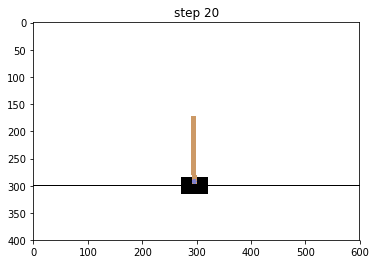

 $=39234.0 v=711
 $=262.0 v=11


In [ ]:
from IPython.display import clear_output
from itertools import count
from gym.wrappers import Monitor

total_reward = 0                #sum of rewards
test_env = loads(root_snapshot) #env used to show progress

for i in count():
    
    #get best child
    mean_reward = 0
    for c in root.children:
        print_tree2(c)
        if c.get_mean_value() > mean_reward:
            mean_reward = c.get_mean_value()
            best_child = c
    #<select child with highest mean reward>
    
    #take action
    s,r,done,_ = test_env.step(best_child.action)
    
    #show image
    clear_output(True)
    plt.title("step %i"%i)
    plt.imshow(test_env.render('rgb_array'))
    plt.show()

    total_reward += r
    if done:
        print("Finished with reward = ",total_reward)
        break
    
    #discard unrealized part of the tree [because not every child matters :(]
    for child in root.children:
        if child != best_child:
            child.safe_delete()

    #declare best child a new root
    root = Root.from_node(best_child)
    for child in root.children:
        cpar = child.parent
        child.parent = root
        del cpar
    
    if root.is_leaf():
        print("exp")
        plan_mcts(root,10)
    #assert not root.is_leaf(), "We ran out of tree! Need more planning! Try growing tree right inside the loop."
    
    #you may want to expand tree here
    #<your code here>


## More stuff

There's a few things you might want to try if you want to dig deeper:

### Node selection and expansion

"Analyze this" assignment

UCB-1 is a weak bound as it relies on a very general bounds (Hoeffding Inequality, to be exact). 
* Try playing with alpha. The theoretically optimal alpha for CartPole is 200 (max reward). 
* Use using a different exploration strategy (bayesian UCB, for example)
* Expand not all but several random actions per `expand` call. See __the notes below__ for details.

The goal is to find out what gives the optimal performance for `CartPole-v0` for different time budgets (i.e. different n_iter in plan_mcts.

Evaluate your results on `AcroBot-v1` - do the results change and if so, how can you explain it?


### Atari-RAM

"Build this" assignment

Apply MCTS to play atari games. In particular, let's start with ```gym.make("MsPacman-ramDeterministic-v0")```.

This requires two things:
* Slightly modify WithSnapshots wrapper to work with atari.

 * Atari has a special interface for snapshots:
   ```   
   snapshot = self.env.ale.cloneState()
   ...
   self.env.ale.restoreState(snapshot)
   ```
 * Try it on the env above to make sure it does what you told it to.
 
* Run MCTS on the game above. 
 * Start with small tree size to speed-up computations
 * You will probably want to rollout for 10-100 steps (t_max) for starters
 * Consider using discounted rewards (see __notes at the end__)
 * Try a better rollout policy
 
 
### Integrate learning into planning

Planning on each iteration is a costly thing to do. You can speed things up drastically if you train a classifier to predict which action will turn out to be best according to MCTS.

To do so, just record which action did the MCTS agent take on each step and fit something to [state, mcts_optimal_action]
* You can also use optimal actions from discarded states to get more (dirty) samples. Just don't forget to fine-tune without them.
* It's also worth a try to use P(best_action|state) from your model to select best nodes in addition to UCB
* If your model is lightweight enough, try using it as a rollout policy.

While CartPole is glorious enough, try expanding this to ```gym.make("MsPacmanDeterministic-v0")```
* See previous section on how to wrap atari

* Also consider what [AlphaGo Zero](https://deepmind.com/blog/alphago-zero-learning-scratch/) did in this area.

### Integrate planning into learning 
_(this will likely take long time, better consider this as side project when all other deadlines are met)_

Incorporate planning into the agent architecture. 

The goal is to implement [Value Iteration Networks](https://arxiv.org/abs/1602.02867)

For starters, remember [week7 assignment](https://github.com/yandexdataschool/Practical_RL/blob/master/week7/7.2_seminar_kung_fu.ipynb)? If not, use [this](http://bit.ly/2oZ34Ap) instead.

You will need to switch it into a maze-like game, consider MsPacman or the games from week7 [Bonus: Neural Maps from here](https://github.com/yandexdataschool/Practical_RL/blob/master/week7/7.3_homework.ipynb).

You will need to implement a special layer that performs value iteration-like update to a recurrent memory. This can be implemented the same way you did attention from week7 or week8.

## Notes


#### Assumptions

The full list of assumptions is
* __Finite actions__ - we enumerate all actions in `expand`
* __Episodic (finite) MDP__ - while technically it works for infinite mdp, we rollout for $ 10^4$ steps. If you are knowingly infinite, please adjust `t_max` to something more reasonable.
* __No discounted rewards__ - we assume $\gamma=1$. If that isn't the case, you only need to change a two lines in `rollout` and use `my_R = r + gamma*child_R` for `propagate`
* __pickleable env__ - won't work if e.g. your env is connected to a web-browser surfing the internet. For custom envs, you may need to modify get_snapshot/load_snapshot from `WithSnapshots`.

#### On `get_best_leaf` and `expand` functions

This MCTS implementation only selects leaf nodes for expansion.
This doesn't break things down because `expand` adds all possible actions. Hence, all non-leaf nodes are by design fully expanded and shouldn't be selected.

If you want to only add a few random action on each expand, you will also have to modify `get_best_leaf` to consider returning non-leafs.

#### Rollout policy

We use a simple uniform policy for rollouts. This introduces a negative bias to good situations that can be messed up completely with random bad action. As a simple example, if you tend to rollout with uniform policy, you better don't use sharp knives and walk near cliffs.

You can improve that by integrating a reinforcement _learning_ algorithm with a computationally light agent. You can even train this agent on optimal policy found by the tree search.

#### Contributions
* Reusing some code from 5vision [solution for deephack.RL](https://github.com/5vision/uct_atari), code by Mikhail Pavlov
* Using some code from [this gist](https://gist.github.com/blole/dfebbec182e6b72ec16b66cc7e331110)